<a href="https://colab.research.google.com/github/danielaterra/shape-features/blob/main/MV_shapeFeatures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
sys.path.append(os.path.join(os.getcwd(), os.pardir))

In [ ]:
!pip install ggplot
!pip install plotnine

In [ ]:
import numpy as np
import pandas as pd
from math import sqrt
import os
import sys
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from skimage import morphology, measure
from skimage.draw import polygon, polygon_perimeter
from scipy.spatial.distance import cdist
from scipy.stats import kurtosis
from random import randint
from random import sample

import xgboost as xgb
import csv
import rpy2
from matplotlib import pyplot as plt
from plotnine import ggplot, aes, facet_grid, labs, geom_col, theme, theme_tufte
from ggplot import *


Análise Multivariada

In [ ]:
from google.colab import drive
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/PDSE')
sys.path.append('/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis')


In [ ]:
## Recupera arquivo
stats = pd.read_csv('/content/drive/MyDrive/PDSE/stats.csv')

In [ ]:
stats.keys()

Index(['Unnamed: 0', 'image_id', 'cell_id', 'bethesda', 'areaN', 'areaC',
       'perimeterN', 'perimeterC', 'major_axisN', 'major_axisC', 'minor_axisN',
       'minor_axisC', 'equivalent_diameterN', 'equivalent_diameterC',
       'radial_distance_maxN', 'radial_distance_maxC', 'radial_distance_meanN',
       'radial_distance_meanC', 'radial_distance_sdN', 'radial_distance_sdC',
       'eccentricityN', 'eccentricityC', 'circularityN', 'circularityC',
       'convexityN', 'convexityC', 'solidityN', 'solidityC', 'extentN',
       'extentC', 'RAN', 'RAC', 'RIN', 'RIC', 'radial_distance_EN',
       'radial_distance_EC', 'radial_distance_kurtoseN',
       'radial_distance_kurtoseC', 'FDN', 'FDC', 'Use_curv1N', 'Use_curv1C',
       'Use_curv2N', 'Use_curv2C', 'Use_curv3N', 'Use_curv3C',
       'major_axis_angleN', 'major_axis_angleC', 'area_NC', 'perimetro_NC',
       'major_axis_NC', 'minor_axis_NC', 'nucleus_position',
       'sub_major_axis_angle_NC', 'convexity_NC'],
      dtype='object'

In [ ]:
## teste duplicidade de linhas
features = ['areaN', 'areaC','perimeterN', 'perimeterC', 'major_axisN', 'major_axisC', 'minor_axisN', \
       'minor_axisC', 'equivalent_diameterN', 'equivalent_diameterC', \
       'radial_distance_maxN', 'radial_distance_maxC', 'radial_distance_meanN', \
       'radial_distance_meanC', 'radial_distance_sdN', 'radial_distance_sdC', \
       'eccentricityN', 'eccentricityC', 'circularityN', 'circularityC', \
       'convexityN', 'convexityC', 'solidityN', 'solidityC', 'extentN', \
       'extentC', 'RAN', 'RAC', 'RIN', 'RIC', 'radial_distance_EN', \
       'radial_distance_EC', 'radial_distance_kurtoseN', 'radial_distance_kurtoseC', 'Use_curv1N', 'Use_curv1C', \
       'Use_curv2N', 'Use_curv2C', 'Use_curv3N', 'Use_curv3C', \
       'major_axis_angleN', 'major_axis_angleC', 'area_NC', 'perimetro_NC', \
       'major_axis_NC', 'minor_axis_NC', 'nucleus_position', 'sub_major_axis_angle_NC', 'convexity_NC']
df = stats[features]

**Correlação entre atributos do Núcleo das células**

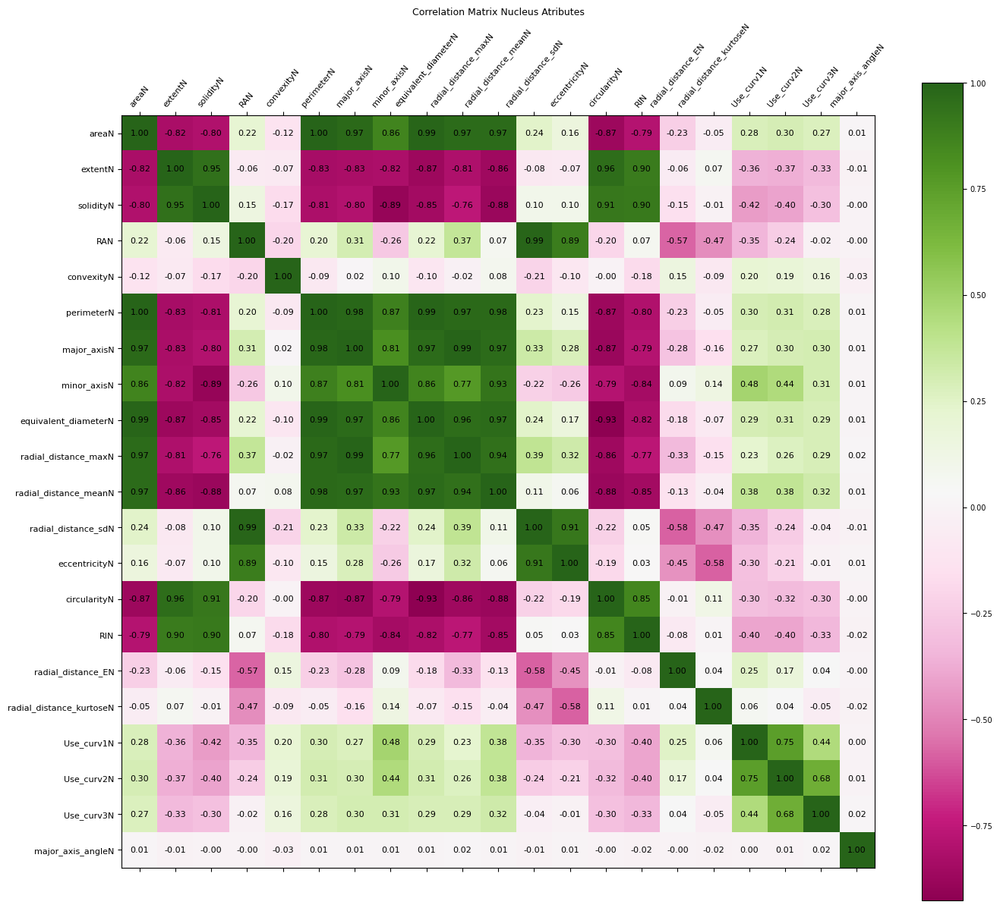

In [ ]:
cols = ['areaN', 'extentN', 'solidityN', 'RAN', 'convexityN', \
       'perimeterN', 'major_axisN',  'minor_axisN', \
       'equivalent_diameterN',  'radial_distance_maxN', 'radial_distance_meanN', \
       'radial_distance_sdN',  'eccentricityN', 'circularityN', 'RIN', 'radial_distance_EN', 'radial_distance_kurtoseN', \
       'Use_curv1N', 'Use_curv2N', 'Use_curv3N', 'major_axis_angleN']


stats_1 = stats[cols]
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)
plt.title('Correlation Matrix Nucleus Atributes', fontsize=9);
filename = 'CorrNucleus.pdf'

fig.savefig(fname="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/"+filename)


Conforme matriz acima, para cada grupo de atributos fortemente correlacionados, apenas um deles será mantido:


1.   **area**, perimetro, major_axis, equivalent_diameter, radia_distance_max e radia_distance_mean. Area será mantida.
2.   **extent** (Ratio of pixels in the region to pixels in the total bounding box), solidity (Ratio of pixels in the region to pixels of the convex hull image) e circularidade (p^2/($pi*A)) e RI (indice de rugosidade). Será mantida extent.
3. **RAN** (taxa  entre: distancias_radiais_maiores_que_a_média/(N* dist_radial_média), radial_distance_sdN (desvio padrão das distancias radiais) e excentricidade (perimetro_convexHull/perimetro) Será mantido RAN.

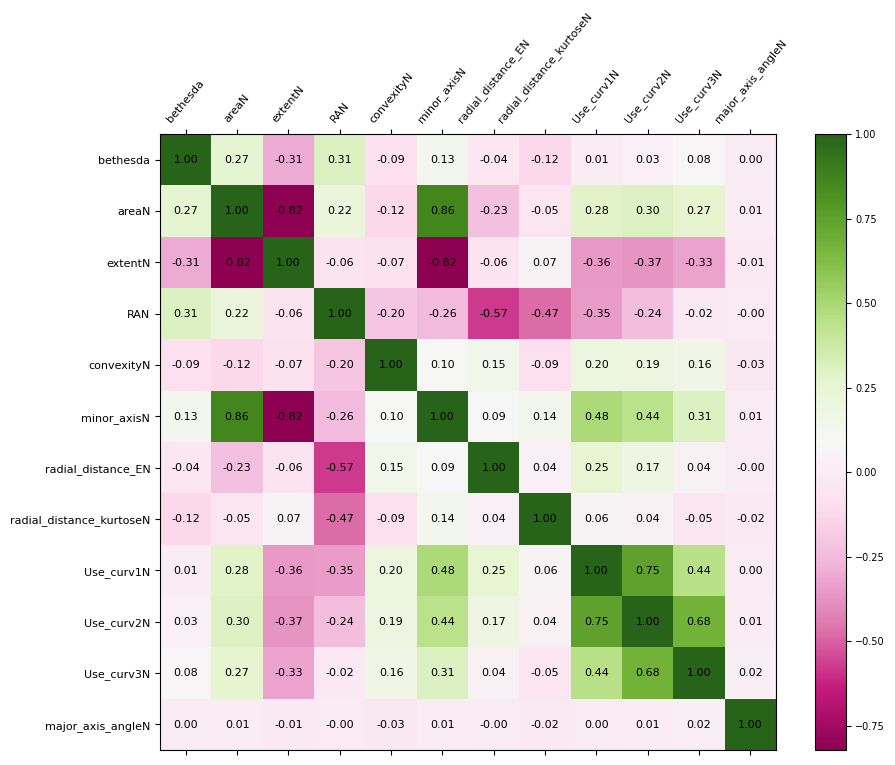

In [ ]:
cols_nucleo = ['bethesda','areaN', 'extentN', 'RAN', 'convexityN', 'minor_axisN', \
               'radial_distance_EN', 'radial_distance_kurtoseN',
               'Use_curv1N', 'Use_curv2N', 'Use_curv3N', 'major_axis_angleN']


stats_1 = stats[cols_nucleo]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)

In [ ]:
cols_nucleo = ['bethesda','areaN', 'extentN', 'RAN', 'convexityN', 'minor_axisN', \
               'radial_distance_EN', 'radial_distance_kurtoseN',
               'Use_curv1N', 'Use_curv3N', 'major_axis_angleN']

stats_1_melt = pd.melt(stats[cols_nucleo], id_vars='bethesda')

**Analise de faixa dos atributos do nucleo**

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 15 x 10 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/NucleoBoxplot.pdf


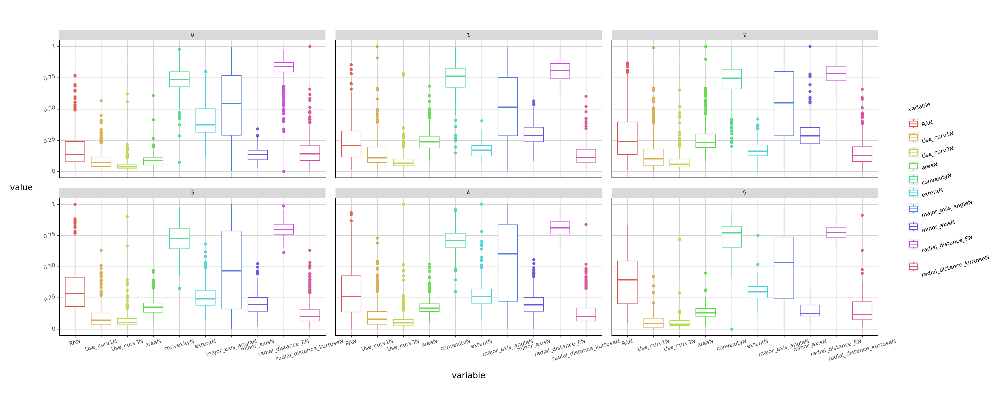

In [ ]:
from plotnine import *
from plotnine.data import *
p = ggplot(stats_1_melt, aes(x= 'variable', y= 'value', col=stats_1_melt.variable, \
                         color= stats_1_melt.variable)) + \
 geom_boxplot() + facet_wrap('~ bethesda') + \
 theme(figure_size=(20,8), \
       axis_line=element_line(size=1, colour="black"), \
         panel_grid_major=element_line(colour="#d3d3d3"), \
       text=element_text(size=8, angle=15), \
            panel_border=element_blank(), \
        panel_background=element_blank(), \
      axis_title_x = element_text(size=12, angle = 0), \
      axis_title_y = element_text(size=12, angle=0))
filename = 'NucleoBoxplot.pdf'
ggsave(p,filename =filename, path ="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis", width=15, height=10)
p.draw()

**Exclui atributos confusos
1. para classes 0 (normal) 1 (ASCUS) e 2 (LSIL): Use_curv1, Use_curv3 e convexidade**
2. para classes 0 (normal), 2(LSIL) e 4 (HSIL): major_axis_angle
3. para classes 2(LSIL)  5(SCC), bem como 0(normal) e 3(ASCH): radial_distance_EN
4. para classes 1(ASCUS) e 4(HSIL): radial_distance_kurtose
5. para classes 0 (normal) e 5 (SCC): quase que apresentam a mesma distribuição pra o atributo minor_axis

In [ ]:
cols_nucleo = ['bethesda','areaN', 'extentN', 'RAN']



**Correlação entre atributos do Citoplasma das células**

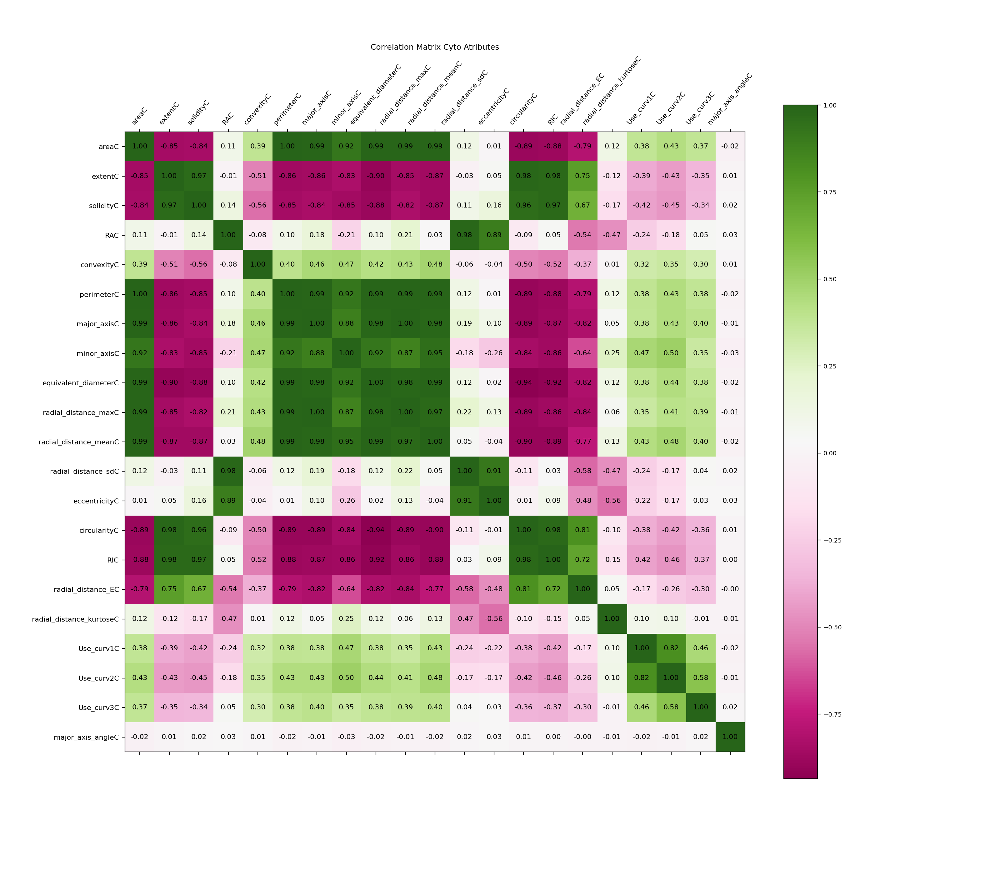

In [ ]:
cols = ['areaC', 'extentC', 'solidityC', 'RAC', 'convexityC', \
       'perimeterC', 'major_axisC',  'minor_axisC', \
       'equivalent_diameterC',  'radial_distance_maxC', 'radial_distance_meanC', \
       'radial_distance_sdC',  'eccentricityC', 'circularityC', 'RIC', 'radial_distance_EC', 'radial_distance_kurtoseC', \
       'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']


stats_1 = stats[cols]
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)
plt.title('Correlation Matrix Cyto Atributes', fontsize=9);
filename = 'CorrCito.pdf'

fig.savefig(fname="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/"+filename)
plt.show()

Conforme matriz acima, as correlações entre atributos do citoplasma são muito semelhantes às do nucleo. Para cada grupo de atributos com correlação > 0.75 apenas um dos atributos será mantido esse sendo diferente do atributo mantido para o núcleo:


1.   area, perimetro, **major_axis**, equivalent_diameter, radia_distance_max e radia_distance_mean. Major_axis será mantido.
2.   extent (Ratio of pixels in the region to pixels in the total bounding box), **solidity** (Ratio of pixels in the region to pixels of the convex hull image) e circularidade (p^2/($pi*A)) e RI (indice de rugosidade). Será mantida solidity.
3. RA (taxa  entre: distancias_radiais_maiores_que_a_média/(N* dist_radial_média), radial_distance_sdN (desvio padrão das distancias radiais) e **excentricidade** (perimetro_convexHull/perimetro) Será mantido excentricidade.
4. Use_curv2 com Use_curv1: Use_curv1 mantida

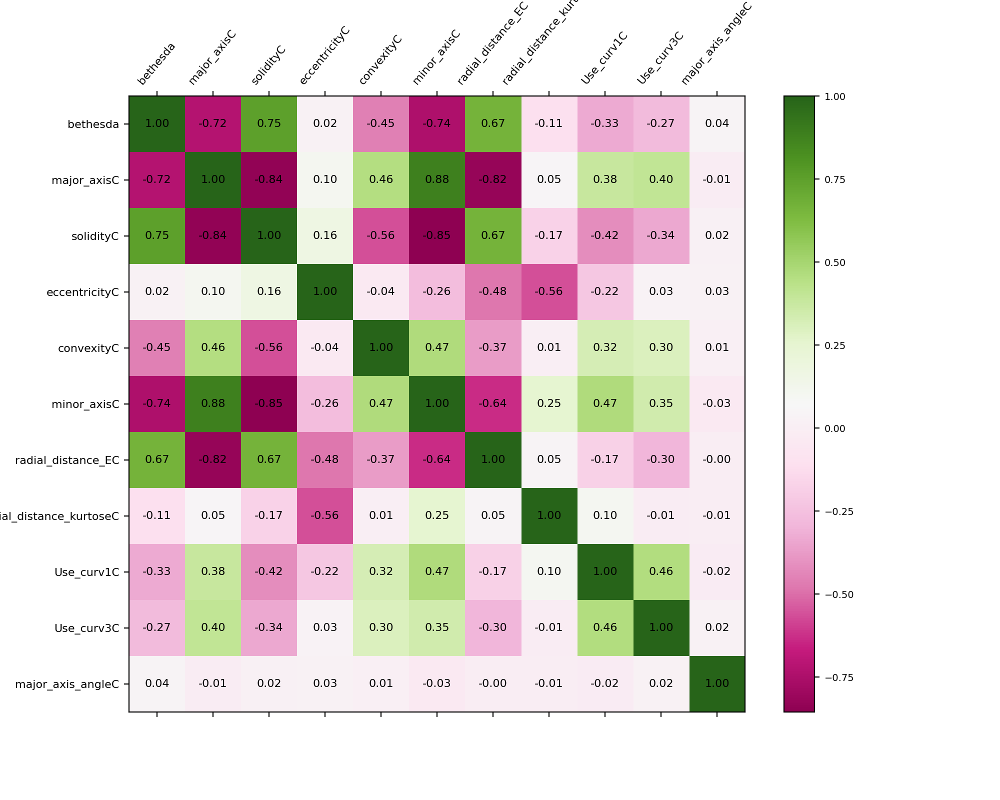

In [ ]:
cols_cyto = ['bethesda','major_axisC', 'solidityC', 'eccentricityC', 'convexityC', 'minor_axisC', \
               'radial_distance_EC', 'radial_distance_kurtoseC', \
              'Use_curv1C', 'Use_curv3C', 'major_axis_angleC']

stats_1 = stats[cols_cyto]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)


**Analise de faixa dos atributos do citoplasma**

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 15 x 10 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/CitoBoxplot.pdf


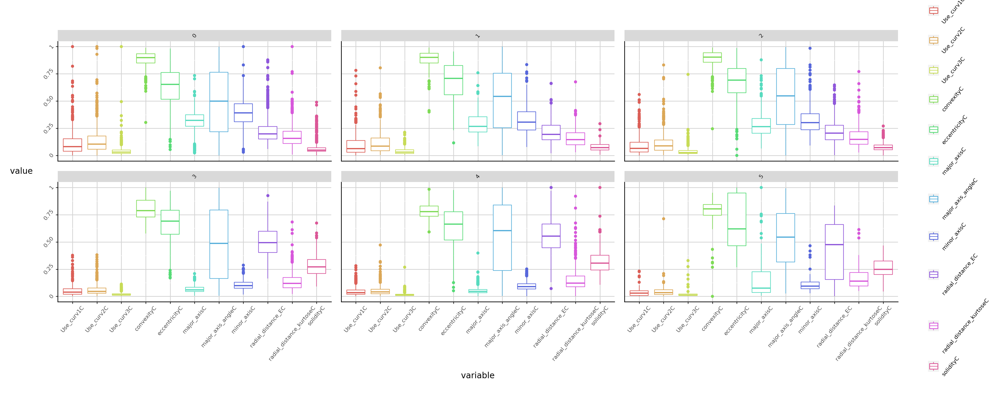

In [ ]:
from plotnine import *
from plotnine.data import *


%matplotlib inline
cols_cyto = ['bethesda','major_axisC', 'solidityC', 'eccentricityC', 'convexityC', 'minor_axisC', \
               'radial_distance_EC', 'radial_distance_kurtoseC', \
              'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']

stats_1_melt = pd.melt(stats[cols_cyto], id_vars='bethesda')

p = ggplot(stats_1_melt, aes(x= 'variable', y= 'value', col=stats_1_melt.variable, \
                         color= stats_1_melt.variable)) + \
 geom_boxplot() + facet_wrap('~ bethesda') + \
 theme(figure_size=(20,8), \
       axis_line=element_line(size=1, colour="black"), \
         panel_grid_major=element_line(colour="#d3d3d3"), \
       text=element_text(size=8, angle=50), \
            panel_border=element_blank(), \
        panel_background=element_blank(), \
      axis_title_x = element_text(size=12, angle = 0), \
      axis_title_y = element_text(size=12, angle=0))
filename = 'CitoBoxplot.pdf'
ggsave(p,filename =filename, path ="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis", width=15, height=10)
p.draw()



**Exclui atributos confusos para normalidade e anormalidade, ou entre lesões de alto e baixo grau.

* para classes 2(ASCUS) e 3 (ASCH), 0(Normal) e 4(HSIL): excentricidade (Eccentricity of the ellipse that has the same second-moments as the region. The eccentricity is the ratio of the focal distance (distance between focal points) over the major axis length. The value is in the interval [0, 1). When it is 0, the ellipse becomes a circle)
* para as classe 0(Normal), 1(ASCUS) e 5(SCC): major_axis_angle
* entre as classes 0(Normal) e 2(LSIL) e 5(SCC): radial_distance_Kurtose
* entre as classes 0(normal), 1(ASCUS) e 2(LSIL): Use_curv3 (Use_curv1 e Use_curv2), convexidade (perimetro do convex hull/perimetro), radial_distance_EC (entropia das distâncias radiais)

* atributos restantes, mantidos, também semelhantes entre classes de baixo e alto grau, bem como a classe normal e as classe para baixo grau: 'major_axisC', 'solidityC' (Ratio of pixels in the region to pixels of the convex hull image.), 'minor_axisC']



In [ ]:
cols_cyto = ['bethesda','major_axisC', 'solidityC', 'minor_axisC']

**Análise de correlação entre os atributos relacionados à célula (ex. razão núcleo e citoplasma)**

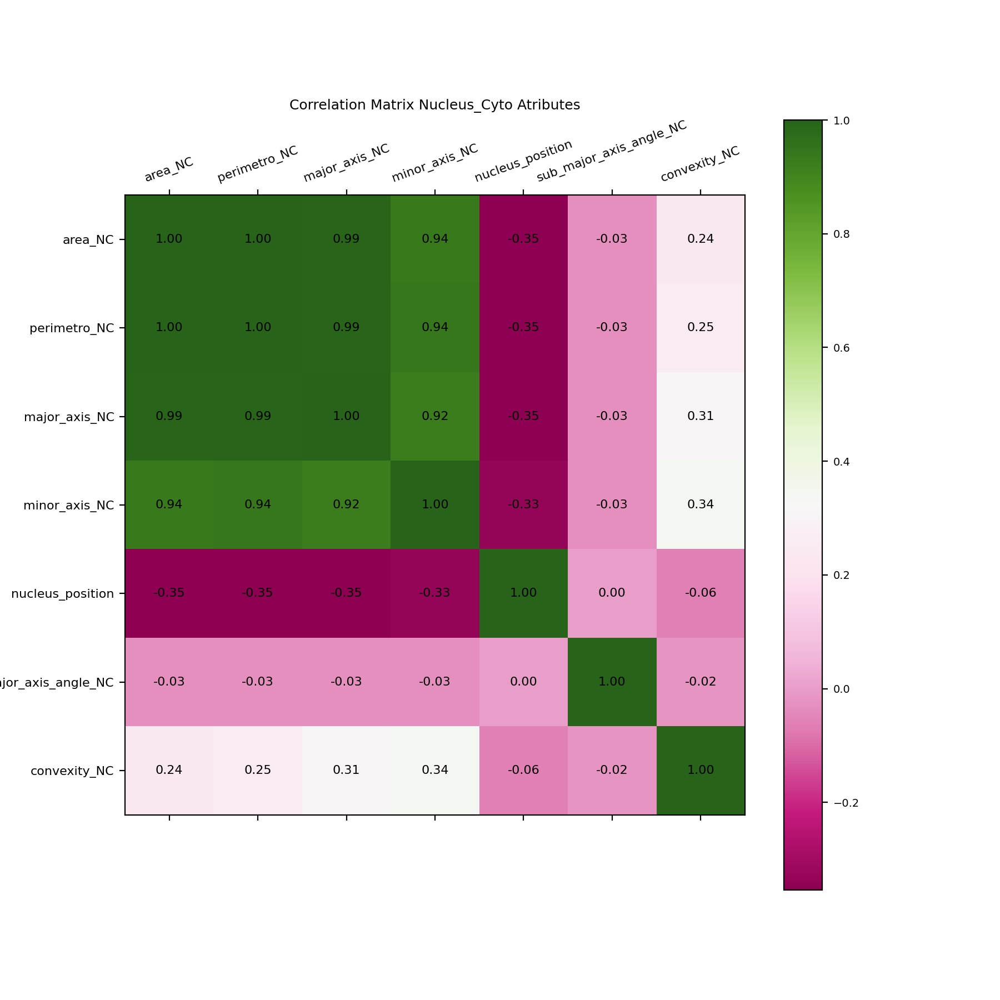

In [ ]:
cols_NC = ['area_NC', 'perimetro_NC', 'major_axis_NC', 'minor_axis_NC', 'nucleus_position', \
           'sub_major_axis_angle_NC', 'convexity_NC']

stats_1 = stats[cols_NC]
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=20)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)
plt.title('Correlation Matrix Nucleus_Cyto Atributes', fontsize=9);
filename = 'CorrNC.pdf'
fig.savefig(fname="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/"+filename)
plt.show()




* A matriz acima mostra forte correlação entre as razões de area, perimetro e eixo_maior e eixo_menor.  A razão de área será mantida

In [ ]:
cols_NC = ['bethesda', 'area_NC', 'nucleus_position', 'sub_major_axis_angle_NC', 'convexity_NC']
stats_1 = stats[cols_NC]

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 15 x 10 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/Cellboxplot.pdf


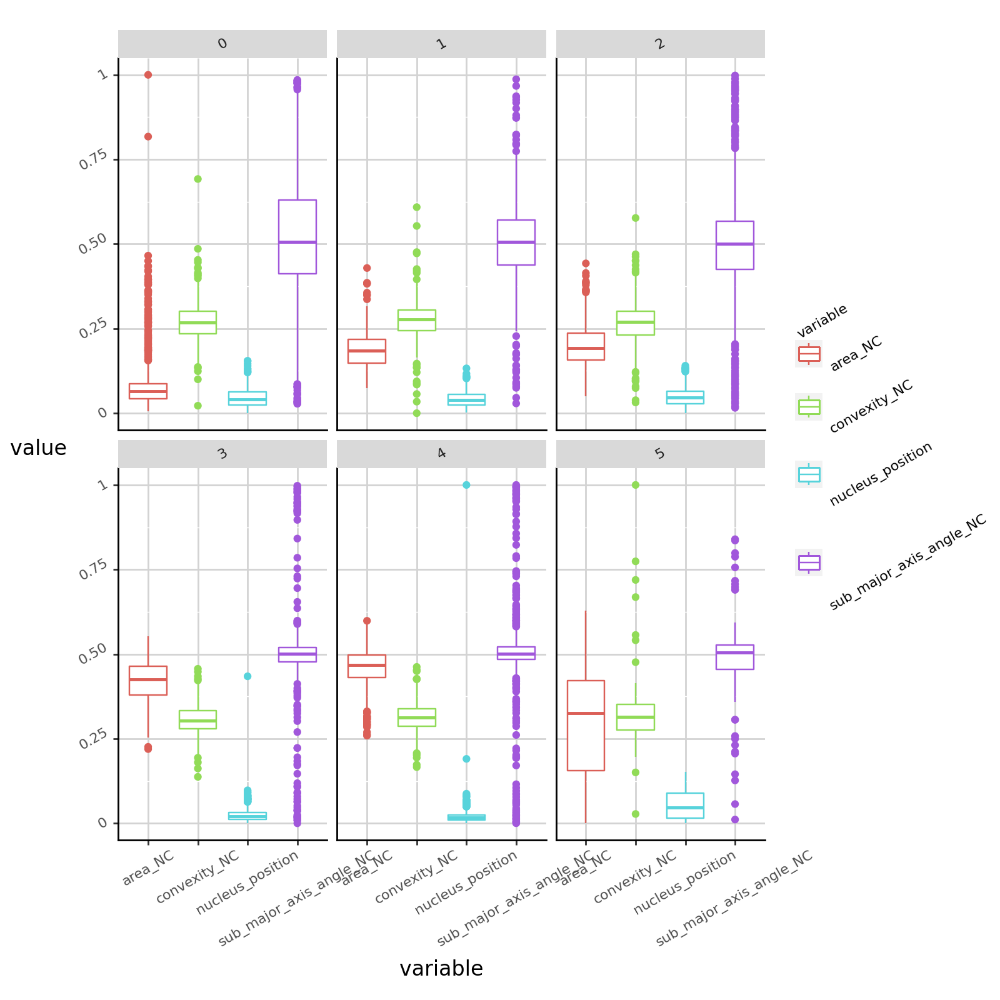

In [ ]:
stats_1_melt = pd.melt(stats_1, id_vars='bethesda')

p = ggplot(stats_1_melt, aes(x= 'variable', y= 'value', col=stats_1_melt.variable, \
                         color= stats_1_melt.variable)) + \
 geom_boxplot() + facet_wrap('~ bethesda') + \
 theme(figure_size=(8,8), \
       axis_line=element_line(size=1, colour="black"), \
         panel_grid_major=element_line(colour="#d3d3d3"), \
       text=element_text(size=8, angle=30), \
            panel_border=element_blank(), \
        panel_background=element_blank(), \
      axis_title_x = element_text(size=12, angle = 0), \
      axis_title_y = element_text(size=12, angle=0))
filename = 'Cellboxplot.pdf'
ggsave(p,filename =filename, path ="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis", width=15, height=10)
p.draw()


**Convexidade** e **posição do núcleo** e **subtração entre os angulos do eixo maior** para nucleo e citoplasma, estão muito semelhantes entre as classes

* Permanece **area_NC**

**Análise dos atributos selecionados **

In [ ]:
 cols_all = ['bethesda','areaN', 'extentN', 'RAN', 'major_axisC','solidityC', 'minor_axisC', 'area_NC']
 stats_2 = stats[cols_all]

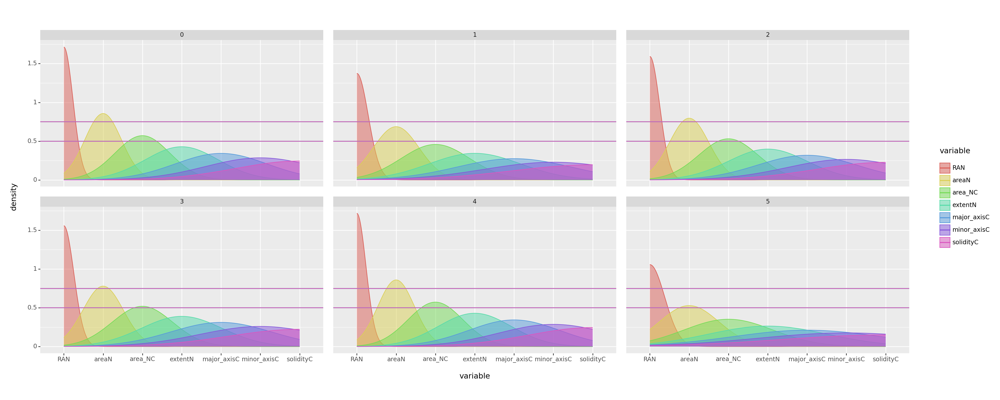

<Figure Size: (2000 x 800)>

In [ ]:
stats_2_melt = pd.melt(stats_2, id_vars='bethesda')
ggplot(stats_2_melt, aes(x= stats_2_melt.variable, \
                         color= stats_2_melt.variable, fill = stats_2_melt.variable)) \
 + geom_density(alpha=0.5) + facet_wrap("~bethesda") + theme(figure_size=(20, 8)) + geom_hline(stats_2_melt, aes(yintercept= 0.75, colour= stats_2_melt.variable)) +  geom_hline(stats_2_melt, aes(yintercept= 0.5, color= stats_2_melt.variable))


**Distribuições 0-4, 2-3 muito semelhantes...**

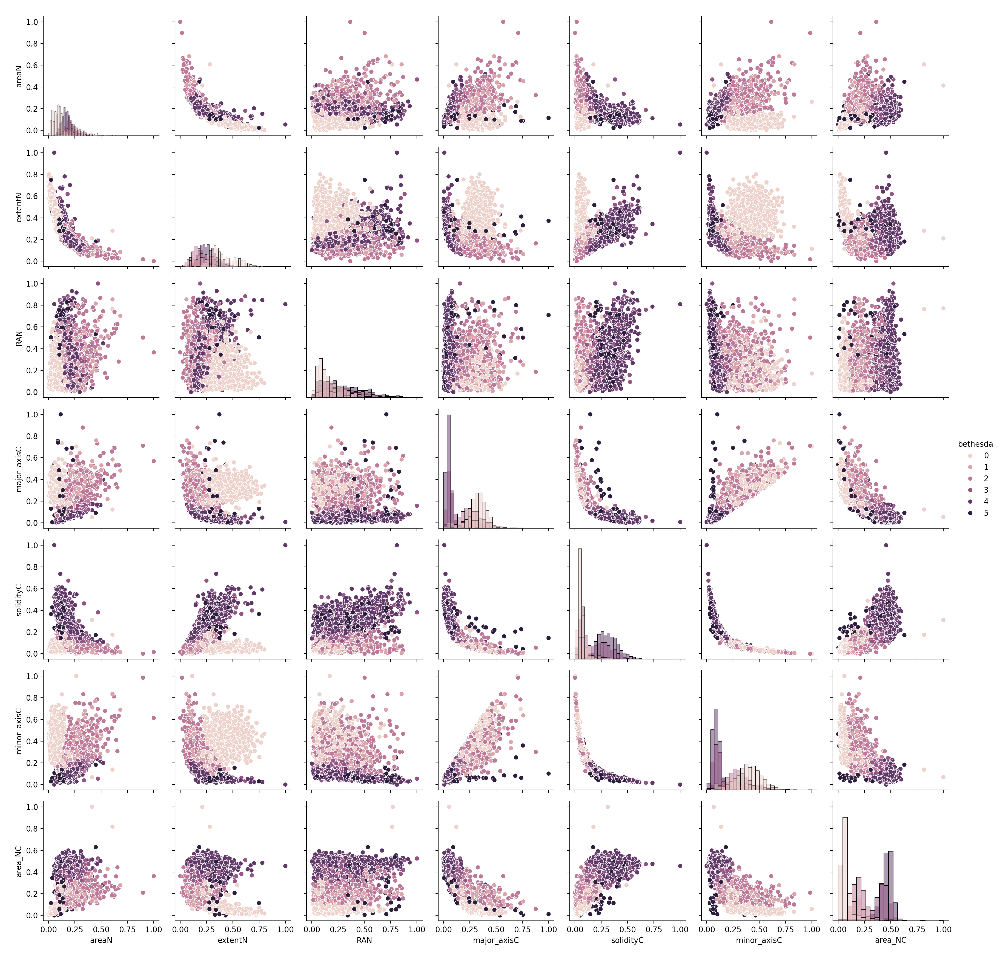

In [ ]:
import seaborn as sns
 cols_all = ['bethesda','areaN', 'extentN', 'RAN', 'major_axisC','solidityC', 'minor_axisC', 'area_NC']
g = sns.PairGrid(stats_2, hue="bethesda")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()


Parece ter relação

*  SolidityC com Major_axis_C e Minor_axes_C: exclui solidityC
*  Minor_axisC com Major_axisC: elimina major_axis_C
*  Area_N com ExtentN: exclui Area_N



**Refazendo sem esses atributos**

In [ ]:
 cols_all = ['bethesda','areaN', 'extentN', 'RAN', 'minor_axisC', 'area_NC']
 stats_2 = stats[cols_all]

NameError: name 'stats' is not defined

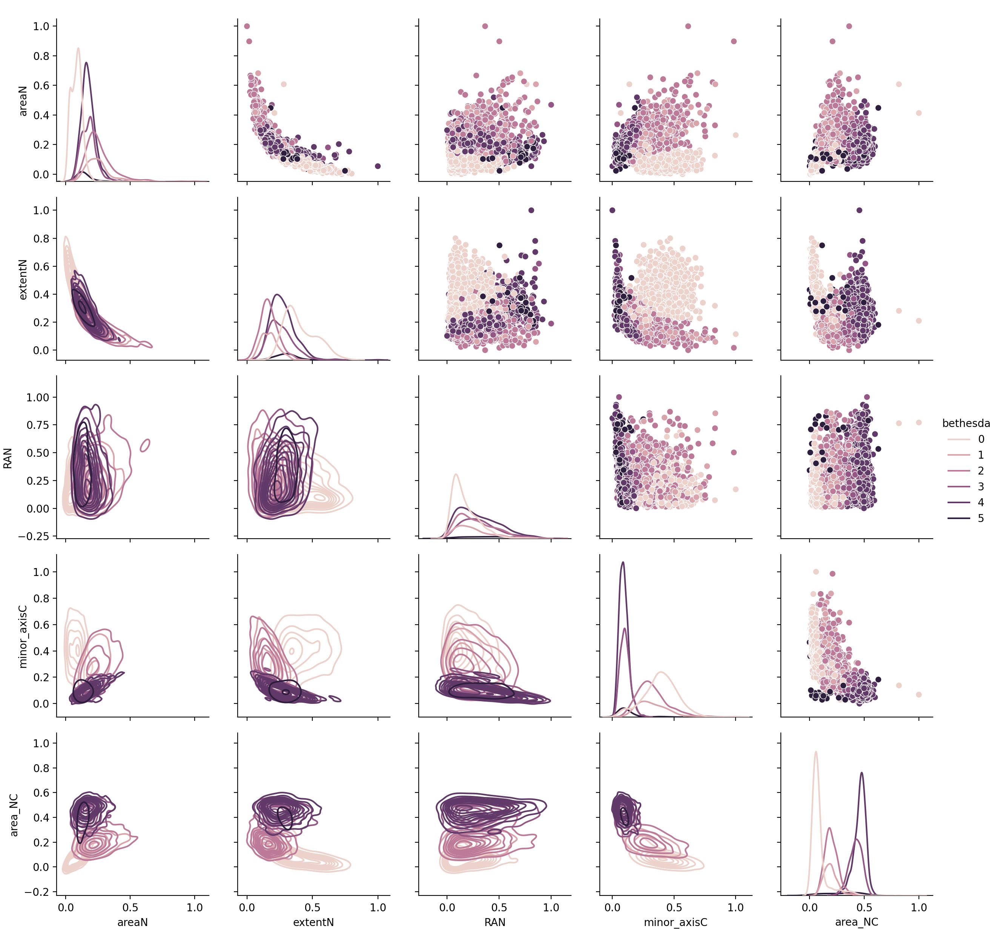

In [ ]:
import seaborn as sns

g = sns.PairGrid(stats_2, hue="bethesda")
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot)
#g.map_offdiag(sns.scatterplot)
g.add_legend()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

#X = stats[['areaN', 'extentN', 'RAN', 'minor_axisC', 'area_NC']]
X = stats[['areaN', 'extentN', 'RAN', 'major_axisC','solidityC', 'minor_axisC', 'area_NC']]
y = stats[['bethesda']]
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.8, random_state=0)

clf = Pipeline(
    steps=[("knn", KNeighborsClassifier(n_neighbors=2))]
)

NameError: name 'stats' is not defined

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


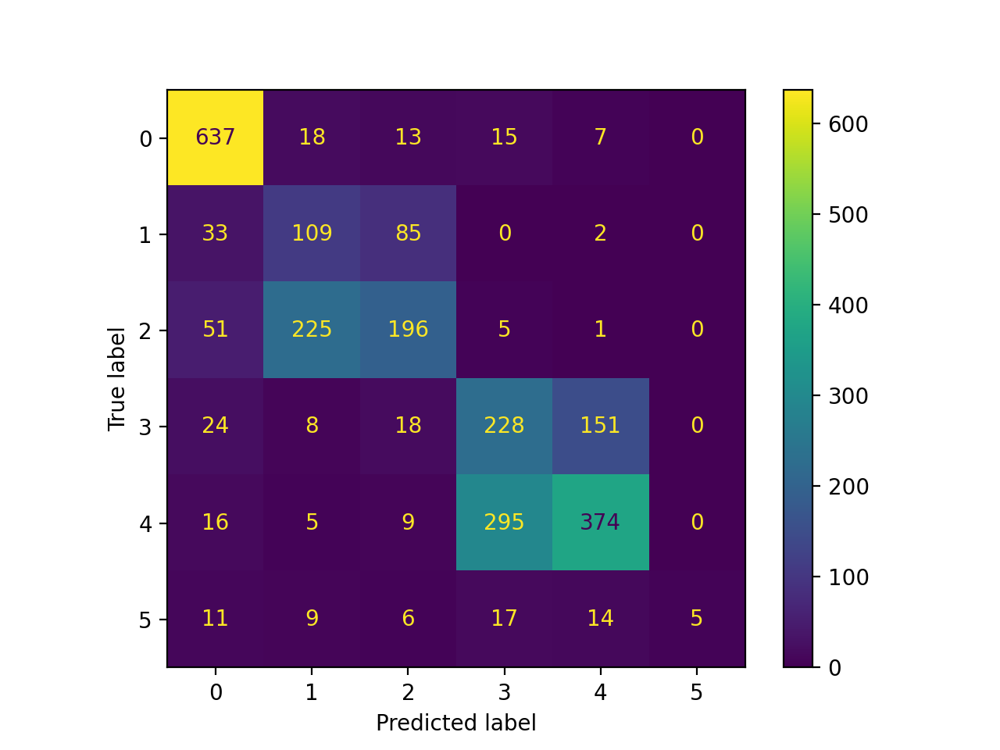

In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import ConfusionMatrixDisplay, recall_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

clf.fit(X_train, y_train)
SVC(random_state=0)
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test)
plt.show()

In [ ]:
recall_score(y_test, clf.predict(X_test), average='weighted')

0.5987630459992269

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


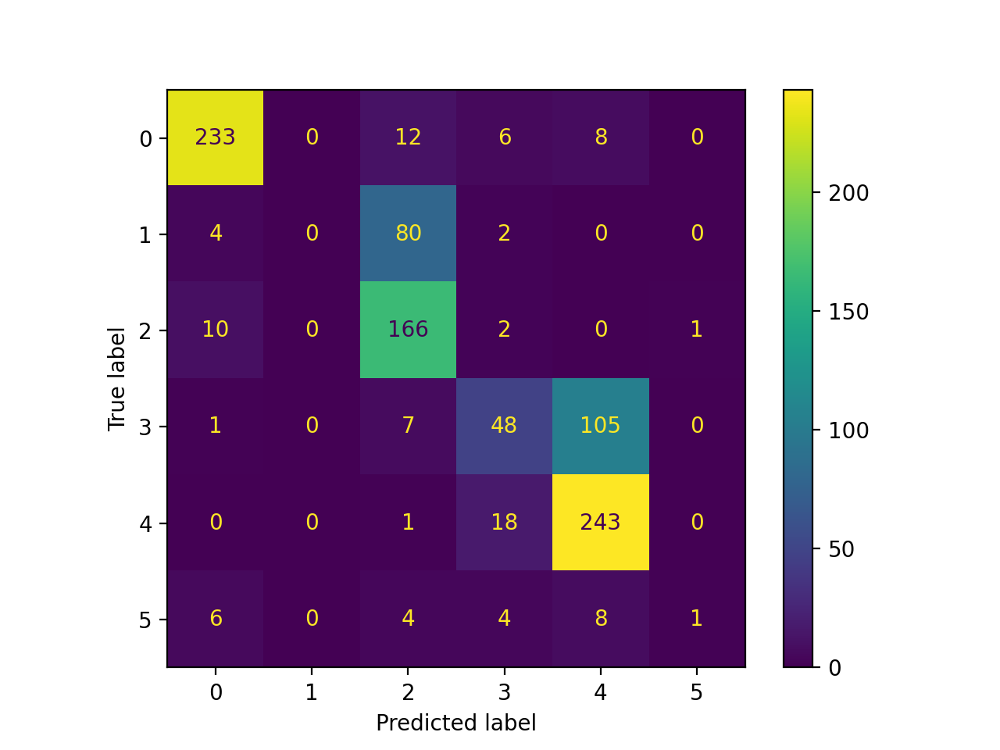

In [ ]:
from sklearn.svm import SVC
clf = SVC(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.3, random_state=0)
clf.fit(X_train, y_train)
SVC(random_state=0)
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test)
plt.show()

In [ ]:
recall_score(y_test, clf.predict(X_test), average='weighted')

0.7123711340206186